## RCES Final Project

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%config InlineBackend.figure_format = 'retina'

In [2]:
import hvplot.pandas

### Loading Data

In [3]:
df = pd.read_csv("https://static-content.springer.com/esm/art%3A10.1038%2Fs43247-022-00418-5/MediaObjects/43247_2022_418_MOESM5_ESM.txt", 
                 sep='\s+', skiprows=4, header=None, names=['date', 'time', 'Lat', 'Lon', 'Depth', 'Mw', 'CC', 'MAD', 'TemplId', 'MTTyp', 'EVTyp'], parse_dates=[0])
df.head()

,date,time,Lat,Lon,Depth,Mw,CC,MAD,TemplId,MTTyp,EVTyp
0,2020-08-01,08:01:21.493,-62.4053,-58.4021,10.9,0.69,0.405,17.321,39,ss,D
1,2020-08-01,08:43:17.795,-62.2868,-58.2250,8.7,1.06,0.450,20.911,74,nf,D
2,2020-08-01,09:25:59.834,-62.3626,-58.3286,4.2,1.10,0.484,17.308,66,nf,D
3,2020-08-01,11:28:15.682,-62.3571,-58.3527,11.0,0.16,0.478,15.825,65,ss,D
4,2020-08-01,12:43:39.631,-62.3826,-58.3742,6.8,0.36,0.477,18.811,46,nf,D


In [4]:
# sep='\s+' removes all white spaces clumped together not just one space
# skiprows=4 removes the first 4 rows
# TemplId: Identificator of the template
# MTTyp: nf = normal faulting, ss = strike-slip, na = not available
# EVTyp: T = template, D = newly detected
# MAD: median absolute deviation

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85206 entries, 0 to 85205
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     85206 non-null  datetime64[ns]
 1   time     85206 non-null  object        
 2   Lat      85206 non-null  float64       
 3   Lon      85206 non-null  float64       
 4   Depth    85206 non-null  float64       
 5   Mw       85206 non-null  float64       
 6   CC       85206 non-null  float64       
 7   MAD      85206 non-null  float64       
 8   TemplId  85206 non-null  int64         
 9   MTTyp    85206 non-null  object        
 10  EVTyp    85206 non-null  object        
dtypes: datetime64[ns](1), float64(6), int64(1), object(3)
memory usage: 7.2+ MB


In [7]:
df.describe()

,Lat,Lon,Depth,Mw,CC,MAD,TemplId
count,85206.000000,85206.000000,85206.000000,85206.000000,85206.000000,85206.000000,85206.000000
mean,-62.332830,-58.297493,8.921279,1.479389,0.481852,20.633588,53.978229
std,0.046404,0.096124,2.241521,0.759553,0.066630,8.192851,36.579724
min,-62.514800,-59.235400,2.900000,-0.600000,0.400000,12.042000,0.000000
25%,-62.362100,-58.348600,7.300000,0.930000,0.432000,18.269000,22.000000
50%,-62.341600,-58.293000,9.800000,1.380000,0.467000,20.181000,53.000000
75%,-62.310700,-58.252275,10.000000,1.940000,0.515000,22.479000,80.000000
max,-62.090000,-57.396500,17.500000,5.980000,1.000000,999.000000,127.000000


In [ ]:
df.nar

In [8]:
#extent = [-60.5, -57.5, -62, -62.6]

### Plotting Study Location

Text(0.5, 1.0, 'Bransfield Strait')

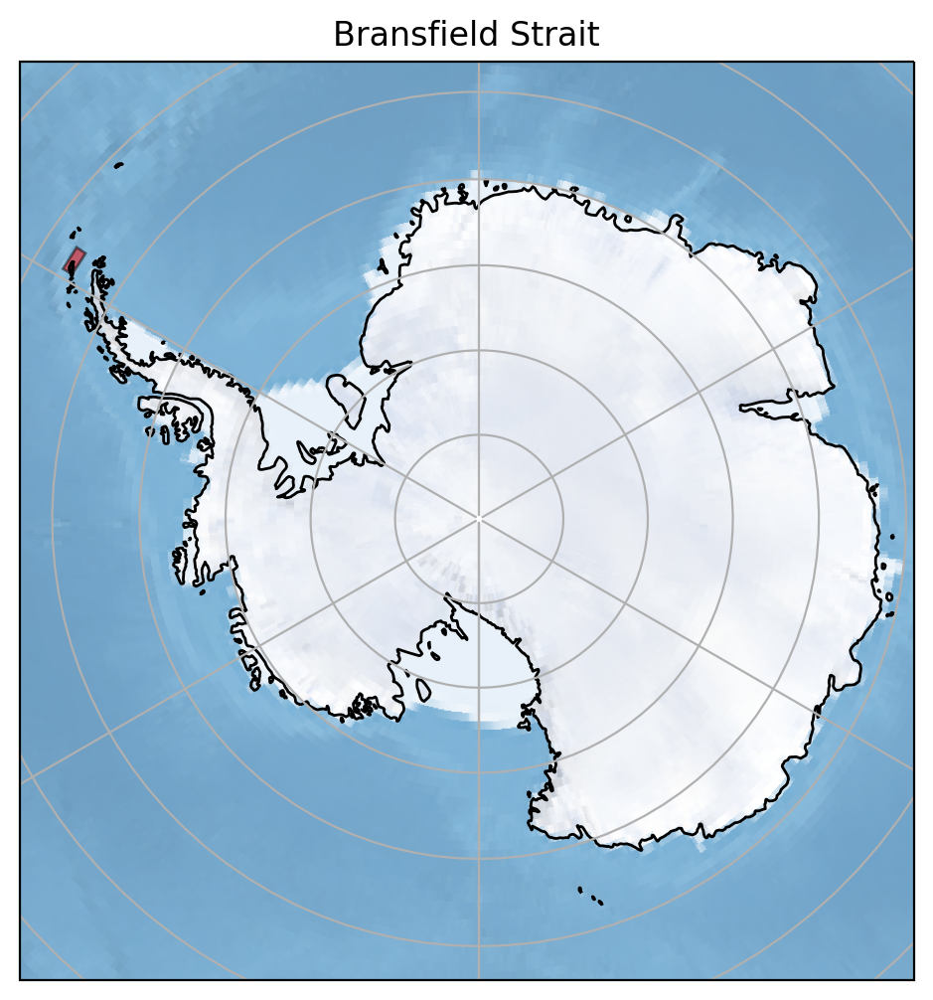

In [29]:
import cartopy.crs as ccrs
import cartopy
import matplotlib.patches as mpatches

#extent = [-60.5, -57.5, -62, -62.6]
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(1,1,1, projection=ccrs.SouthPolarStereo())
ax.set_extent([-250, 50, -90, -63], ccrs.PlateCarree())
ax.coastlines()
ax.gridlines()
#ax.gridlines()
ax.stock_img()

ax.add_patch(mpatches.Rectangle(xy=[-59, -62.3], width=3, height=.6,
                                    facecolor='red',
                                    edgecolor='k',
                                    alpha=0.5,
                                    transform=ccrs.PlateCarree()))
ax.set_title('Bransfield Strait')

In [41]:
df.hvplot.points(x='Lon', y='Lat', rasterize=True, cnorm='eq_hist', geo=True, tiles='EsriImagery', frame_width=800, cmap='Reds') \
.opts(title='Density of Earthquakes', xlabel='Longitude', ylabel='Latitude')

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [Lon,Lat]   (Lon_Lat Count)

### Focal Mechanism Plots

In [11]:
df_faults = df.groupby('MTTyp')

In [42]:
df_faults.get_group('ss').hvplot.scatter(x='Lon', y= 'Lat', width=600, grid=True, label='Strike Slip').opts(legend_position='top_left', title='Earthquake Location by Fault Type') * \
df_faults.get_group('nf').hvplot.scatter(x='Lon', y= 'Lat', width=600 , grid=True, label='Normal Fault') * \
df_faults.get_group('na').hvplot.scatter(x='Lon', y= 'Lat', width=600 , grid=True, label='Undetermined')

:Overlay
   .Scatter.Strike_Slip  :Scatter   [Lon]   (Lat)
   .Scatter.Normal_Fault :Scatter   [Lon]   (Lat)
   .Scatter.Undetermined :Scatter   [Lon]   (Lat)

In [44]:
df_faults.get_group('na').hvplot.scatter(x='date', y='Mw', label='Not Determined', width=800, c='k', alpha=0.2).opts(legend_position='top_left', title='Magnitude Distribution by Date') * \
df_faults.get_group('ss').hvplot.scatter(x='date', y='Mw', label='Strike Slip', c='red', alpha=0.1) * \
df_faults.get_group('nf').hvplot.scatter(x='date', y='Mw', label='Normal Fault', c='blue', alpha=0.1)
#Abrupt decline in activity after October 2, 2020 magnitude 5.9 EQ and November 6, 2020 magnitude 6 EQ


:Overlay
   .Scatter.Not_Determined :Scatter   [date]   (Mw)
   .Scatter.Strike_Slip    :Scatter   [date]   (Mw)
   .Scatter.Normal_Fault   :Scatter   [date]   (Mw)

In [15]:
ss = df_faults.get_group('ss')
nf = df_faults.get_group('nf')
na = df_faults.get_group('na')

Text(0.5, 1.0, 'Magnitude Distribution by Date')

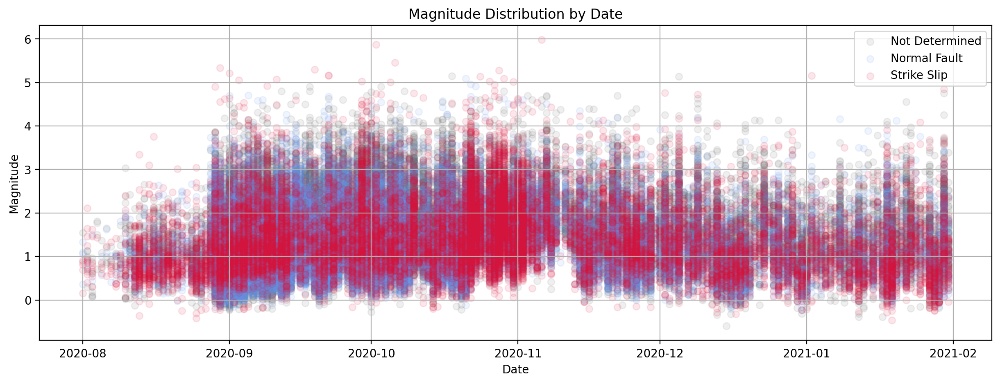

In [45]:
import matplotlib.dates as mdates

fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot()
ax.scatter(na.date, na.Mw, c='dimgrey', alpha=0.1, label='Not Determined')
ax.scatter(nf.date, nf.Mw, c='cornflowerblue', alpha=0.1, label='Normal Fault')
ax.scatter(ss.date, ss.Mw, c='crimson', alpha=0.1, label='Strike Slip')
ax.legend()
ax.grid()
ax.set_xlabel('Date')
ax.set_ylabel('Magnitude')
ax.set_title('Magnitude Distribution by Date')
#ax.annotate('Test',(mdates.date2num(na.date[1]), na.Mw[1]), xytext=(15, 15), 
            #textcoords='offset points', arrowprops=dict(arrowstyle='-|>'))

<AxesSubplot: xlabel='date'>

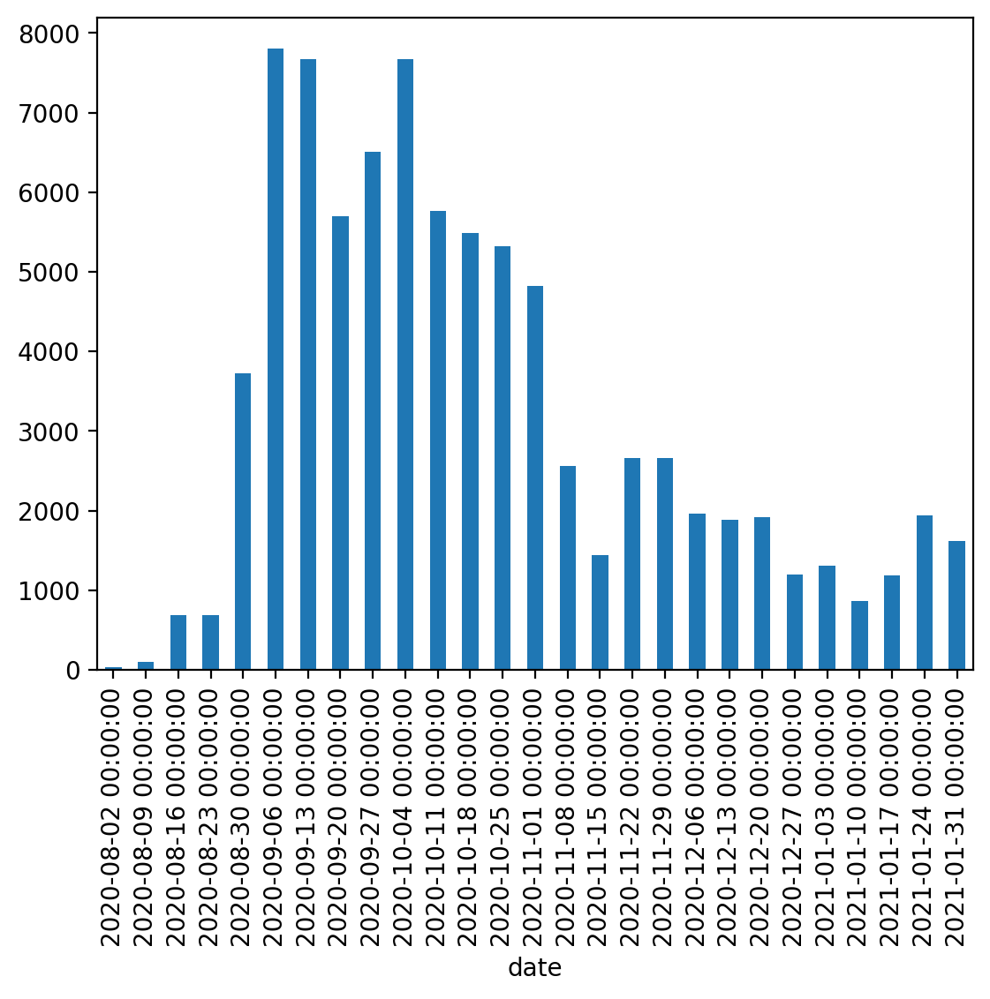

In [72]:
df_by_date = df.set_index('date')
df_by_date.resample('W').Mw.count().plot(kind='bar')

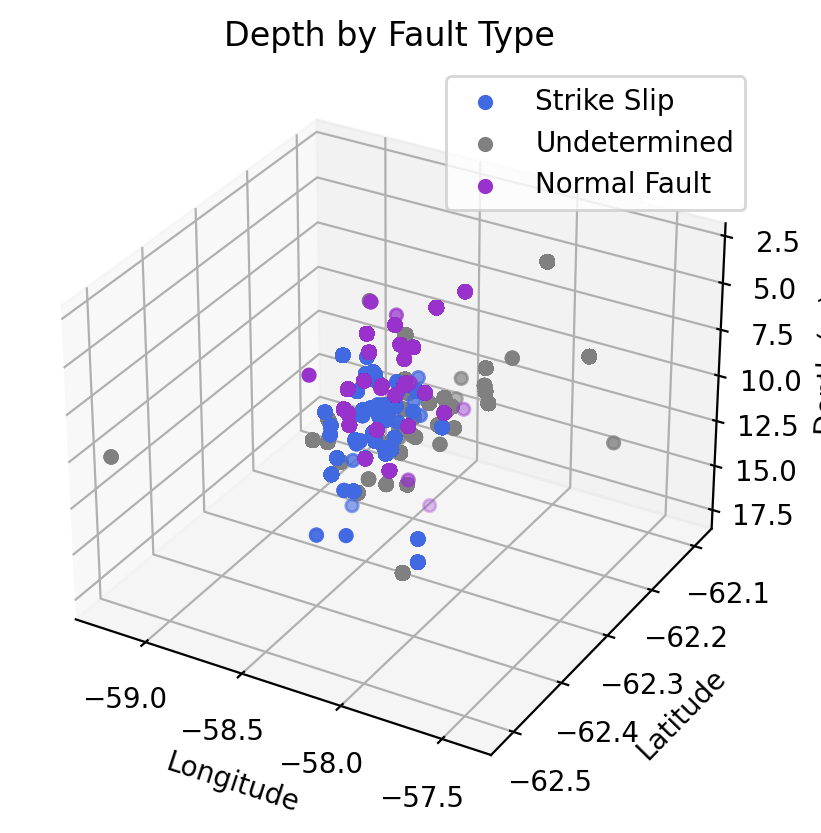

In [46]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(ss.Lon, ss.Lat, ss.Depth, c='royalblue', label='Strike Slip')
ax.scatter(na.Lon, na.Lat, na.Depth, c='grey', label='Undetermined')
ax.scatter(nf.Lon, nf.Lat, nf.Depth, c='darkorchid', label='Normal Fault')
ax.invert_zaxis()
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (m)')
ax.legend()
ax.set_title('Depth by Fault Type');

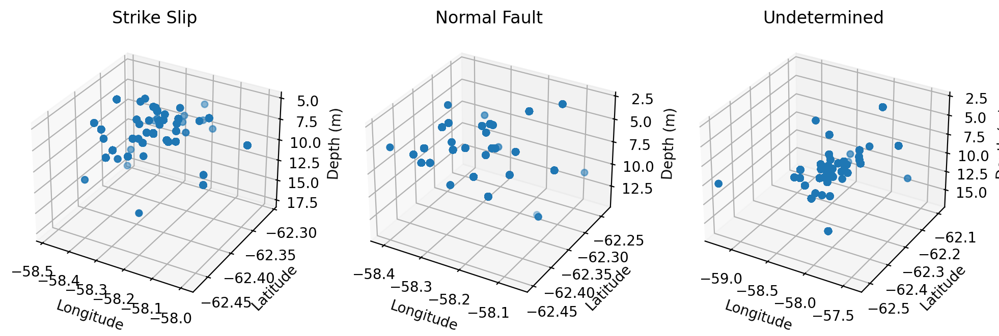

In [54]:
fig, ax = plt.subplots(ncols=3, subplot_kw={'projection': '3d'}, figsize=(12, 5))
ax[0].scatter(ss.Lon, ss.Lat, ss.Depth)
ax[0].invert_zaxis()
ax[0].set_xlabel('Longitude')
ax[0].set_ylabel('Latitude')
ax[0].set_zlabel('Depth (m)')
ax[0].set_title('Strike Slip')

ax[1].scatter(nf.Lon, nf.Lat, nf.Depth)
ax[1].invert_zaxis()
ax[1].set_xlabel('Longitude')
ax[1].set_ylabel('Latitude')
ax[1].set_zlabel('Depth (m)')
ax[1].set_title('Normal Fault')

ax[2].scatter(na.Lon, na.Lat, na.Depth) 
ax[2].invert_zaxis()
ax[2].set_xlabel('Longitude')
ax[2].set_ylabel('Latitude')
ax[2].set_zlabel('Depth (m)')
ax[2].set_title('Undetermined');

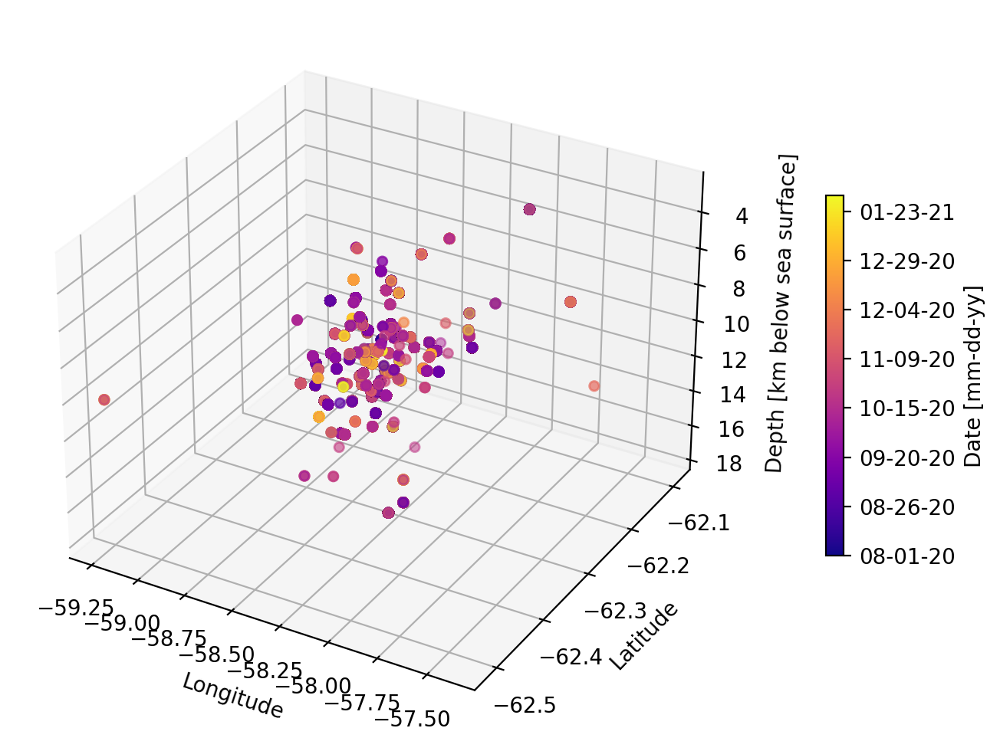

In [20]:
from mpl_toolkits import mplot3d
from matplotlib.dates import DateFormatter, date2num

fig, ax = plt.subplots(subplot_kw={'projection': '3d'}, figsize=(12, 5))
figure = ax.scatter(df.Lon, df.Lat, df.Depth, c=[date2num(i.date()) for i in df.date], cmap='plasma')
cbar = fig.colorbar(figure, ax=ax, shrink=0.5, format=DateFormatter('%m-%d-%y'))
cbar.set_label('Date [mm-dd-yy]')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth [km below sea surface]')
ax.invert_zaxis()
ax.ticklabel_format(useOffset=False)
plt.tight_layout()


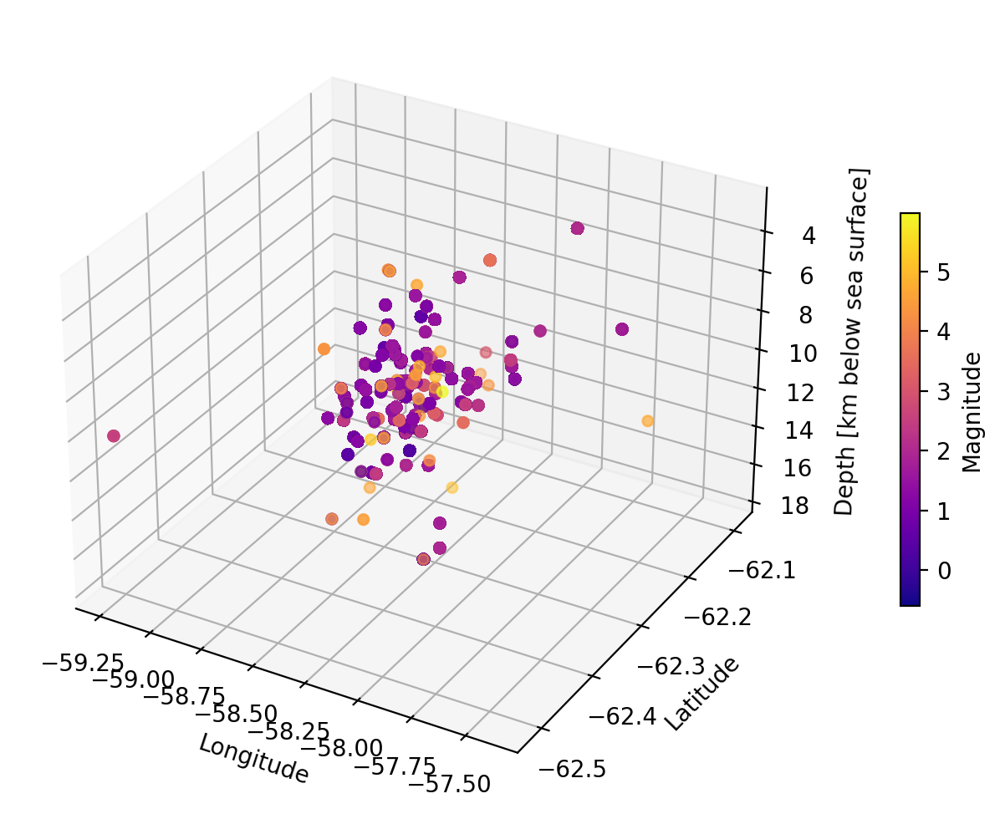

In [50]:
fig, ax = plt.subplots(subplot_kw={'projection': '3d'}, figsize=(12, 5))
figure = ax.scatter(df.Lon, df.Lat, df.Depth, c=df.Mw, cmap='plasma')
cbar = fig.colorbar(figure, ax=ax, shrink=0.5)
cbar.set_label('Magnitude')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth [km below sea surface]')
ax.invert_zaxis()
ax.ticklabel_format(useOffset=False)
plt.tight_layout()

In [ ]:
#add scatter by mag
#then scatter by mag comparing fault type

In [ ]:
#try to slice by time